In [1]:
from scipy.signal import butter, lfilter
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk
import h5py
import os.path
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import librosa.display
# from kneed import KneeLocator
import os
import urllib

import numpy as np
from scipy.io import loadmat

from tensorpac import Pac, EventRelatedPac, PreferredPhase
from tensorpac.utils import PeakLockedTF, PSD, ITC, BinAmplitude
from tensorpac.signals import pac_signals_wavelet

import matplotlib.pyplot as plt
plt.style.use('seaborn-poster')

In [2]:
save_path = "/home/hosseini/Desktop/2024/06.03.2024/Preprocessed/Output"
save_pathh = "/home/hosseini/Desktop/2024/06.03.2024/Preprocessed/Output/mPFC_Slice1_Multitaper"
save_path_eSpike = "/home/hosseini/Desktop/2024/06.03.2024/Preprocessed/Output/mPFC_eSpike_Slice1"
save_path_coherence = "/home/hosseini/Desktop/2024/06.03.2024/Preprocessed/Output/mPFC_coherence_Slice1"
name = '\_06032024_mPFC_Slice1'
strain = 'WT'
name2 = str('_06032024_mPFC_Slice1')

# filenames

data_path = "/home/hosseini/Desktop/2024/06.03.2024/Preprocessed"
file_xtrain_baseline = data_path + "/2024-06-03__Slice1_S5E2_Chr2_eYFP_mPFC_Baseline__0004.h5"
file_xtrain_stim = data_path + r"/2024-06-03__Slice1_S5E2_Chr2_eYFP_mPFC_Stimulation_.h5"
################################################################### Baseline
with h5py.File(file_xtrain_baseline, 'r') as hdf:
    dt1 = hdf.get('Data/Recording_0/AnalogStream/Stream_0')
    dt1_items = list(dt1.items())
    ChannelData_baseline = np.array(dt1.get('ChannelData'))
    print(ChannelData_baseline.shape)
################################################################### Stimulation
with h5py.File(file_xtrain_stim, 'r') as hdf:
    dt1 = hdf.get('Data/Recording_0/AnalogStream/Stream_0')
    dt1_items = list(dt1.items())
    ChannelData_stim = np.array(dt1.get('ChannelData'))
    print(ChannelData_stim.shape)

sf = 20000 # sampling requency    
print(f'time recorded in min: {((len(ChannelData_baseline[1])/sf)/60)}')



(60, 6040000)
(60, 6000000)
time recorded in min: 5.033333333333333


In [3]:
# dim_x=60 # number of electrodes
# dim_y=2401980 # time in seconds with fs 20k
data_concat = np.concatenate((ChannelData_baseline[:,:], 
                              ChannelData_stim[:,:],
                             ), axis=1)
np.shape(data_concat)

(60, 12040000)

In [3]:
unwanted_num = [14, 51, 101, 
                32, 42, 52, 102,  
                13, 33, 53, 63,  83, 93, 103, 
                24, 54, 64, 74, 84,  104,  
               ]# channels to be removed




# List of numbers with corresponding indices as shown in the image
numbers_dict = {
    54: 0, 56: 1, 55: 2, 46: 3, 45: 4, 44: 5, 36: 6, 35: 7, 34: 8, 26: 9,
    16: 10, 25: 11, 15: 12, 24: 13, 14: 14, 13: 15, 23: 16, 12: 17, 22: 18,
    11: 19, 21: 20, 33: 21, 32: 22, 31: 23, 43: 24, 42: 25, 41: 26, 52: 27,
    51: 28, 53: 29, 63: 30, 61: 31, 62: 32, 71: 33, 72: 34, 73: 35, 81: 36,
    82: 37, 83: 38, 91: 39, 101: 40, 92: 41, 102: 42, 93: 43, 103: 44,
    104: 45, 94: 46, 105: 47, 95: 48, 106: 49, 96: 50, 84: 51, 85: 52,
    86: 53, 74: 54, 75: 55, 76: 56, 65: 57, 66: 58, 64: 59
}

# Function to get corresponding indices, excluding unwanted numbers
def get_corresponding_values(selected_nums):
    filtered_values = [numbers_dict[num] for num in selected_nums if num not in unwanted_num and num in numbers_dict]
    return filtered_values

# L2/3
L_2_3 = get_corresponding_values([11,21,31,41,51,61,71,81,91,101])
# L5
L_5 = get_corresponding_values([12,22,32,42,52,62,72,92,102,
                        13,23,43,53,63,73,83,93,103,
                        24,34,54,64,74,84,94,104,
#                         15,25,35,45,55,65,75,85,95,105,
#                         16,26,36,46,56,66,76,86,96,106,
                               ]
                        )

In [ ]:
import warnings
warnings.filterwarnings('ignore')
from matplotlib.backends.backend_pdf import PdfPages
import numpy as np
import matplotlib.pyplot as plt
import os
import resampy
from scipy import signal
from scipy.signal import find_peaks
import pandas as pd

# Define time segments for different stimulation periods
time_segments = {
    'stim1': (8, 9),
    'stim2': (24, 25),
    'stim4': (40, 41),
    'stim8': (56, 57),
    'stim16': (72, 74),
    'stim32': (88, 90),
    'stim64': (104, 106),
    'stim128': (120, 123)
}

dta = ChannelData_stim
sf = 20000
target_sf = 20000

# Placeholder for metadata
layer_col = 'Layer2_3'
id_col = name
strain_col = strain

# Function to detect spikes with a threshold
def get_spikes(data, spike_window, tf, offset, max_thresh, min_height):
    peaks, _ = find_peaks(data, height=min_height)
    wave_form = [data[peak - spike_window:peak + spike_window] for peak in peaks]
    return peaks, wave_form

# Prepare PDF for plots
pdf_pages_all1 = PdfPages(os.path.join(save_path, name + 'spikes.pdf'))

spike_data_per_segment = {segment: [] for segment in time_segments}  # Dictionary to store spikes for each segment

for segment_name, (start, end) in time_segments.items():
    for i in L_2_3:  # Loop through selected channels
        chanlNo = i  # Channel number
        data = dta[chanlNo].ravel()  # Assuming dta is your data array

        # Create data vector for the specified range
        data_segment = data[start * sf:end * sf]

        # Create a time vector for the resampled data
        time_resampled = np.linspace(0, len(data) / target_sf, len(data))

        # Plotting
        fig, axx = plt.subplots(figsize=(15, 4))
        axx.plot(time_resampled, data, c='k', label='Signal')

        # Highlight the segment
        seg_start = int(start * target_sf)
        seg_end = int(end * target_sf)
        axx.plot(time_resampled[seg_start:seg_end], data[seg_start:seg_end], c='b', label=f'{segment_name} Segment')

        # Get minimum value within the segment to represent spike detection
        peak = np.min(data[seg_start:seg_end])
        spike_data_per_segment[segment_name].append(peak)  # Store spike amplitude for averaging

        # Highlight detected spike
        plt.plot(time_resampled[seg_start], peak, marker='o', c='r', markersize=8)

        plt.title(f'Spike detected, Channel No: {i}, Segment: {segment_name}', fontsize=23)
        plt.xlabel('Time [s]', fontsize=20)
        plt.ylabel('Amplitude [uV]', fontsize=16)
        plt.tick_params(labelsize=12)
        plt.legend()
        plt.show()
        pdf_pages_all1.savefig(fig)
#         plt.savefig(os.path.join(save_path, name + str(i) + f'_{segment_name}_spikes.svg'), bbox_inches='tight')
        plt.close()

pdf_pages_all1.close()

# Calculate the average spike per segment and prepare data for export
avg_spike_data = []
for segment_name, spikes in spike_data_per_segment.items():
    avg_spike = np.mean(spikes) if spikes else np.nan  # Handle empty cases
    avg_spike_data.append({'Segment': segment_name, 'Average Spike Amplitude': avg_spike})

# Exporting data to Excel
file_name = f"{name}_spikes_{layer_col}.xlsx"
save_path_new = os.path.join(save_path, file_name)
# Exporting data to Excel with metadata
writer = pd.ExcelWriter(save_path_new, engine='xlsxwriter')

# Write average spike data to Excel
avg_spike_df = pd.DataFrame(avg_spike_data)
avg_spike_df['Layer'] = layer_col
avg_spike_df['ID'] = id_col
avg_spike_df['Strain'] = strain_col

avg_spike_df.to_excel(writer, sheet_name='Average Amplitude', index=False)

writer.save()

In [ ]:
import warnings
warnings.filterwarnings('ignore')
from matplotlib.backends.backend_pdf import PdfPages
import numpy as np
import matplotlib.pyplot as plt
import os
import resampy
from scipy import signal
from scipy.signal import find_peaks
import pandas as pd


dta = ChannelData_stim
sf = 20000
target_sf = 20000

# Placeholder for metadata
layer_col = 'Layer5'
id_col = name
strain_col = strain

# Function to detect spikes with a threshold
def get_spikes(data, spike_window, tf, offset, max_thresh, min_height):
    peaks, _ = find_peaks(data, height=min_height)
    wave_form = [data[peak - spike_window:peak + spike_window] for peak in peaks]
    return peaks, wave_form

# Prepare PDF for plots
pdf_pages_all1 = PdfPages(os.path.join(save_path, name + 'spikes.pdf'))

spike_data_per_segment = {segment: [] for segment in time_segments}  # Dictionary to store spikes for each segment

for segment_name, (start, end) in time_segments.items():
    for i in L_5:  # Loop through selected channels
        chanlNo = i  # Channel number
        data = dta[chanlNo].ravel()  # Assuming dta is your data array

        # Create data vector for the specified range
        data_segment = data[start * sf:end * sf]

        # Create a time vector for the resampled data
        time_resampled = np.linspace(0, len(data) / target_sf, len(data))

        # Plotting
        fig, axx = plt.subplots(figsize=(15, 4))
        axx.plot(time_resampled, data, c='k', label='Signal')

        # Highlight the segment
        seg_start = int(start * target_sf)
        seg_end = int(end * target_sf)
        axx.plot(time_resampled[seg_start:seg_end], data[seg_start:seg_end], c='b', label=f'{segment_name} Segment')

        # Get minimum value within the segment to represent spike detection
        peak = np.min(data[seg_start:seg_end])
        spike_data_per_segment[segment_name].append(peak)  # Store spike amplitude for averaging

        # Highlight detected spike
        plt.plot(time_resampled[seg_start], peak, marker='o', c='r', markersize=8)

        plt.title(f'Spike detected, Channel No: {i}, Segment: {segment_name}', fontsize=23)
        plt.xlabel('Time [s]', fontsize=20)
        plt.ylabel('Amplitude [uV]', fontsize=16)
        plt.tick_params(labelsize=12)
        plt.legend()
        plt.show()
        pdf_pages_all1.savefig(fig)
#         plt.savefig(os.path.join(save_path, name + str(i) + f'_{segment_name}_spikes.svg'), bbox_inches='tight')
        plt.close()

pdf_pages_all1.close()

# Calculate the average spike per segment and prepare data for export
avg_spike_data = []
for segment_name, spikes in spike_data_per_segment.items():
    avg_spike = np.mean(spikes) if spikes else np.nan  # Handle empty cases
    avg_spike_data.append({'Segment': segment_name, 'Average Spike Amplitude': avg_spike})

# Exporting data to Excel
file_name = f"{name}_spikes_{layer_col}.xlsx"
save_path_new = os.path.join(save_path, file_name)
# Exporting data to Excel with metadata
writer = pd.ExcelWriter(save_path_new, engine='xlsxwriter')

# Write average spike data to Excel
avg_spike_df = pd.DataFrame(avg_spike_data)
avg_spike_df['Layer'] = layer_col
avg_spike_df['ID'] = id_col
avg_spike_df['Strain'] = strain_col

avg_spike_df.to_excel(writer, sheet_name='Average Amplitude', index=False)

writer.save()

# Lowpass filter & downsample the data

In [4]:
def filter_data(data, low, high, sf, order=2):
    # Determine Nyquist frequency
    nyq = sf/2

    # Set bands
    low = low/nyq
    high = high/nyq

    # Calculate coefficients
    b, a = butter(order, [low, high], btype='bandpass',)

    # Filter signal
    filtered_data = lfilter(b, a, data)

    return filtered_data


def downsample_data(data, sf, target_sf):
    # Calculate the initial downsampling factor
    factor = int(sf / target_sf)
    
    # Check if downsampling is necessary
    if factor < 1:
        raise ValueError("Target sampling frequency must be less than original sampling frequency.")
    
    # Downsample using multiple steps if necessary
    data_down = data
    while factor > 1:
        # Apply decimation in chunks to avoid excessive decimation
        step_factor = min(factor, 10)  # Decimate in steps of max 10 to avoid aliasing
        data_down = signal.decimate(data_down, step_factor, ftype='fir')
        sf = sf / step_factor  # Update the sampling rate after each decimation
        factor = int(sf / target_sf)  # Recalculate the factor for the next iteration

    return data_down, int(sf)

# Apply the eprevious steps (notch 60, filter, downsample) to Combined data

In [7]:
from scipy import signal
from scipy.signal import butter, lfilter
sf = 20000 # sampling frequency
target_sf = 10000 # target frequency for downsampling
f0 = 60.0  # Frequency to be removed from signal (Hz)
w0 = f0/(target_sf/2)  # Normalized Frequency
Q = 30 # Quality factor
# Design notch filter
b, a = signal.iirnotch(w0, Q)


start = 0
end = int(len(data_concat[0])/sf)
################################################### all data comined
clean_data = []
lfp_power = []
# clean_data_power = []
for chanlNo in range(len(data_concat)):
    data = data_concat[chanlNo].ravel()
    # compare the raw data with the filtered signal
    spike_data = filter_data(data[start*sf:end*sf], low=4, high=400, sf=sf) # Band pass filter the data for LFP analysis
    # Now we use the above function to downsample the signal.
    lfp_data, sf_lfp = downsample_data(spike_data, sf=sf, target_sf=target_sf)
    lfp_power.append(signal.welch(lfp_data, fs=sf_lfp, window='hamming', nperseg=1024, scaling='spectrum'))
    clean_data.append(signal.lfilter(b, a, lfp_data))

# Multitaper Spectrogram

In [8]:
%run /home/hosseini/Desktop/multitaper_spectrogram.py

In [9]:
# from multitaper_spectrogram_python import multitaper_spectrogram  # import multitaper_spectrogram function from the multitaper_spectrogram_python.py file
# Set spectrogram params
fs = 2000  # Sampling Frequency
frequency_range = [1, 250]  # Limit frequencies from 0 to 25 Hz
time_bandwidth = 5  # Set time-half bandwidth
num_tapers = 8  # Set number of tapers (optimal is time_bandwidth*2 - 1)
window_params = [4, 1]  # Window size is 4s with step size of 1s
min_nfft = 0  # No minimum nfft
detrend_opt = 'constant'  # detrend each window by subtracting the average
multiprocess = True  # use multiprocessing
n_jobs = -1  # use 3 cores in multiprocessing
weighting = 'unity'  # weight each taper at 1
plot_on = True  # plot spectrogram
clim_scale = False # do not auto-scale colormap
verbose = False  # print extra info
xyflip = False  # do not transpose spect output matrix

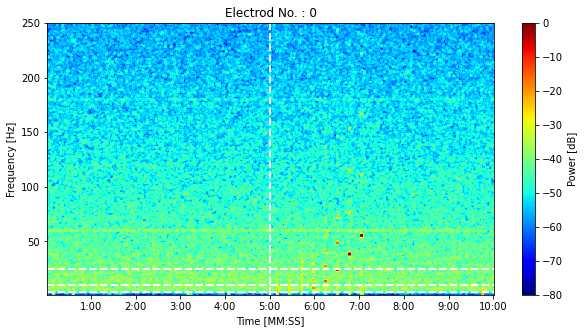

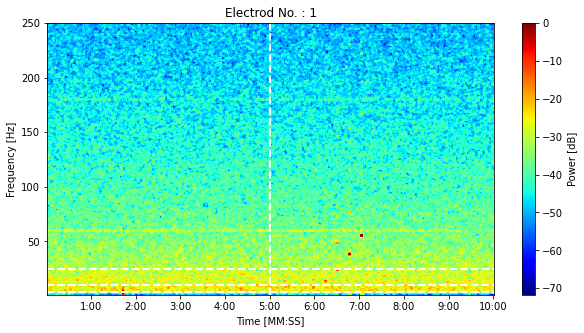

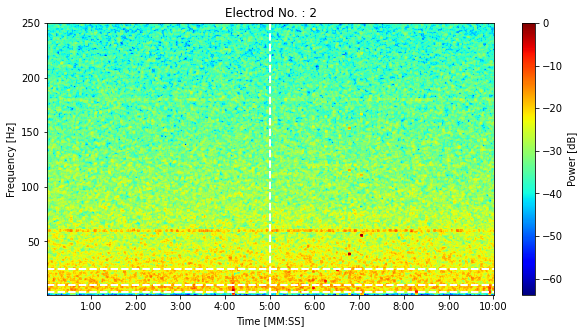

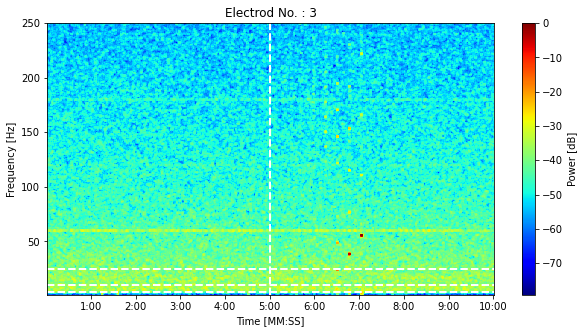

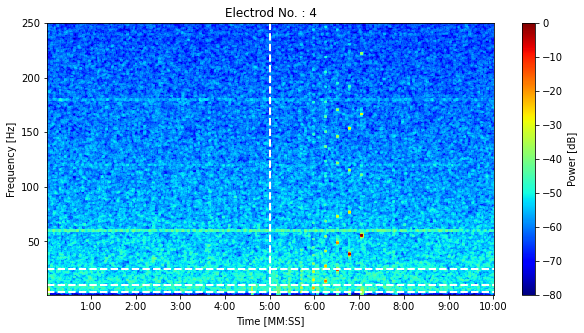

...

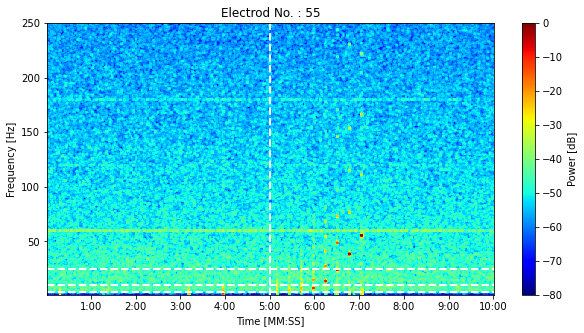

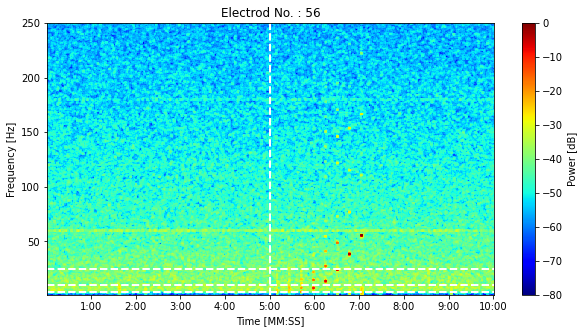

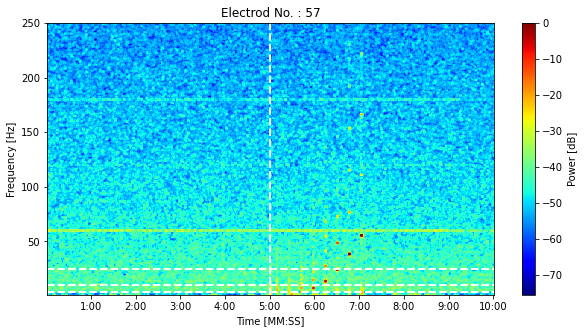

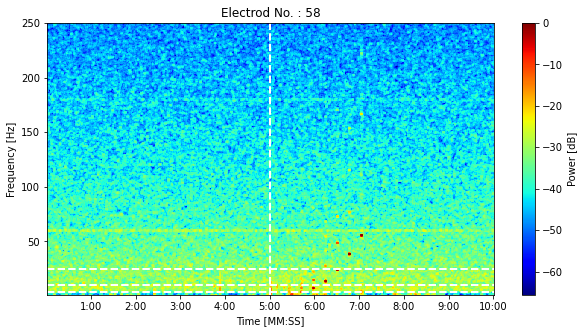

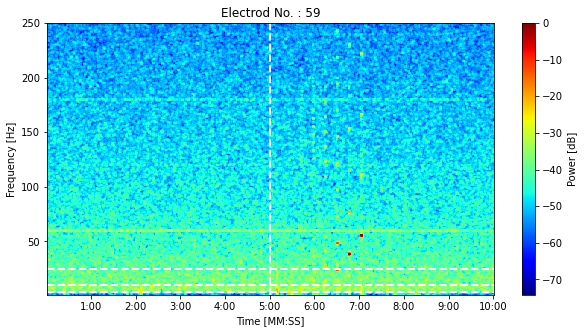

In [9]:
import warnings
warnings.filterwarnings('ignore')
import os.path
#first we filter the raw data and then downsample the raw data 
from matplotlib.backends.backend_pdf import PdfPages
pdf_pages = PdfPages(os.path.join(save_pathh,'Multitaper.pdf'))
for i in range (len(clean_data)):
    spect, stimes, sfreqs = multitaper_spectrogram(clean_data[i], 
                                                   fs, 
                                                   frequency_range, 
                                                   time_bandwidth, 
                                                   num_tapers, 
                                                   window_params, min_nfft, detrend_opt,
                                                   multiprocess, n_jobs,
                                                   weighting, 
#                                                    plot_on, 
                                                   clim_scale, 
                                                   verbose, xyflip)
    # For saving the graphs
    spect_data = spect
    clim = np.percentile(spect_data, [5, 95])  # Scale colormap from 5th percentile to 95th

    #         freqs, times, spectrogram = signal.spectrogram(data)#######
    fig = plt.figure(figsize=(10, 5))
    librosa.display.specshow(librosa.amplitude_to_db(spect, ref=np.max), x_axis='time', y_axis='linear',
                             x_coords=stimes, y_coords=sfreqs, shading='auto', 
                             cmap= "jet"
                            )
    plt.colorbar(label='Power [dB]')
    plt.xlabel("Time [MM:SS]")
    plt.ylabel("Frequency [Hz]")
    if clim_scale:
        plt.clim(clim)  # actually change colorbar scale
    
    plt.title(f'Electrod No. : {i}')
    plt.axhline(y = 4, color = 'w', linestyle = '--', linewidth= 2.0 )
    plt.axhline(y = 10, color = 'w', linestyle = '--', linewidth= 2.0 )
    plt.axhline(y = 25, color = 'w', linestyle = '--', linewidth= 2.0 )
    
    plt.axvline(x = 5*60 ,color = 'w', linestyle = '--', linewidth= 2.0 ) #  

    pdf_pages.savefig(fig)
######## Saving
    plt.savefig(os.path.join(save_pathh , 'ElectrodeNo{}.svg'.format(i)),bbox_inches = 'tight')
pdf_pages.close()
    

In [10]:
from scipy import signal
from scipy.signal import butter, lfilter
sf = 20000 # sampling frequency
target_sf = 10000 # target frequency for downsampling
f0 = 60.0  # Frequency to be removed from signal (Hz)
w0 = f0/(target_sf/2)  # Normalized Frequency
Q = 30 # Quality factor
# Design notch filter
b, a = signal.iirnotch(w0, Q)

target_data = ChannelData_stim
start = 0
end = int(len(target_data[0])/sf)
################################################### all data comined
clean_data = []
lfp_power = []
# clean_data_power = []
for chanlNo in range(len(target_data)):
    data = target_data[chanlNo].ravel()
    # compare the raw data with the filtered signal
    spike_data = filter_data(data[start*sf:end*sf], low=1, high =400,sf=sf) # Band pass filter the data for LFP analysis
    # Now we use the above function to downsample the signal.
    lfp_data, sf_lfp = downsample_data(spike_data, sf=sf, target_sf=target_sf)
    lfp_power.append(signal.welch(lfp_data, fs=sf_lfp, window='hamming', nperseg=2048, scaling='spectrum', average='mean'))
    clean_data.append(signal.lfilter(b, a, lfp_data))

In [11]:
# from multitaper_spectrogram_python import multitaper_spectrogram  # import multitaper_spectrogram function from the multitaper_spectrogram_python.py file
# Set spectrogram params
fs = 2000  # Sampling Frequency
frequency_range = [0, 200]  # Limit frequencies from 0 to 25 Hz
time_bandwidth = 3  # Set time-half bandwidth
num_tapers = 5  # Set number of tapers (optimal is time_bandwidth*2 - 1)
window_params = [1, 0.9]  # Window size is 4s with step size of 1s
min_nfft = 0  # No minimum nfft
detrend_opt = 'constant'  # detrend each window by subtracting the average
multiprocess = True  # use multiprocessing
n_jobs = -1  # use 3 cores in multiprocessing
weighting = 'unity'  # weight each taper at 1
plot_on = True  # plot spectrogram
clim_scale = False # do not auto-scale colormap
verbose = False  # print extra info
xyflip = False  # do not transpose spect output matrix

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import os.path
#first we filter the raw data and then downsample the raw data 
from matplotlib.backends.backend_pdf import PdfPages
pdf_pages = PdfPages(os.path.join(save_pathh,'Multitaper_stim.pdf'))
for i in range (len(clean_data)):
    spect, stimes, sfreqs = multitaper_spectrogram(clean_data[i], 
                                                   fs, 
                                                   frequency_range, 
                                                   time_bandwidth, 
                                                   num_tapers, 
                                                   window_params, min_nfft, detrend_opt,
                                                   multiprocess, n_jobs,
                                                   weighting, 
#                                                    plot_on, 
                                                   clim_scale, 
                                                   verbose, xyflip)
    # For saving the graphs
    spect_data = spect
    clim = np.percentile(spect_data, [5, 95])  # Scale colormap from 5th percentile to 95th

    #         freqs, times, spectrogram = signal.spectrogram(data)#######
    fig = plt.figure(figsize=(20, 5))
    librosa.display.specshow(librosa.amplitude_to_db(spect, ref=np.max), x_axis='time', y_axis='linear',
                             x_coords=stimes, y_coords=sfreqs, shading='auto', 
                             cmap= "jet"
                            )
    plt.colorbar(label='Power [dB]')
    plt.xlabel("Time [MM:SS]")
    plt.ylabel("Frequency [Hz]")
    if clim_scale:
        plt.clim(clim)  # actually change colorbar scale
    
    plt.title(f'Electrod No. : {i}')
    plt.axhline(y = 4, color = 'w', linestyle = '--', linewidth= 2.0 )
    plt.axhline(y = 10, color = 'w', linestyle = '--', linewidth= 2.0 )
    plt.axhline(y = 25, color = 'w', linestyle = '--', linewidth= 2.0 )

    plt.axvline(x = 9, color = 'w', linestyle = '--', linewidth= 2.0 ) #  1 HZ 35 seconds change the timing
    plt.axvline(x = 25, color = 'w', linestyle = '--', linewidth= 2.0 ) #  2 HZ
    plt.axvline(x = 42, color = 'w', linestyle = '--', linewidth= 2.0 ) #  4 HZ
    plt.axvline(x = 58, color = 'w', linestyle = '--', linewidth= 2.0 ) #  8 HZ
    plt.axvline(x = 74, color = 'w', linestyle = '--', linewidth= 2.0 ) #  16 HZ
    plt.axvline(x = 90, color = 'w', linestyle = '--', linewidth= 2.0 ) #  32 HZ
    plt.axvline(x = 107, color = 'w', linestyle = '--', linewidth= 2.0 ) #  64 HZ
    plt.axvline(x = 123, color = 'w', linestyle = '--', linewidth= 2.0 )  #  128 HZ

    pdf_pages.savefig(fig)
######## Saving
    plt.savefig(os.path.join(save_pathh , 'ElectrodeNo{}.svg'.format(i)),bbox_inches = 'tight')
pdf_pages.close()
    

# STOP :) 
## Dear Sky: Please CHOOSE the channels with minimum noise

In [5]:
unwanted_num = [14, 51, 101, 
                32, 42, 52, 102,  
                13, 33, 53, 63,  83, 93, 103, 
                24, 54, 64, 74, 84,  104,  
               ]# channels to be removed




# List of numbers with corresponding indices as shown in the image
numbers_dict = {
    54: 0, 56: 1, 55: 2, 46: 3, 45: 4, 44: 5, 36: 6, 35: 7, 34: 8, 26: 9,
    16: 10, 25: 11, 15: 12, 24: 13, 14: 14, 13: 15, 23: 16, 12: 17, 22: 18,
    11: 19, 21: 20, 33: 21, 32: 22, 31: 23, 43: 24, 42: 25, 41: 26, 52: 27,
    51: 28, 53: 29, 63: 30, 61: 31, 62: 32, 71: 33, 72: 34, 73: 35, 81: 36,
    82: 37, 83: 38, 91: 39, 101: 40, 92: 41, 102: 42, 93: 43, 103: 44,
    104: 45, 94: 46, 105: 47, 95: 48, 106: 49, 96: 50, 84: 51, 85: 52,
    86: 53, 74: 54, 75: 55, 76: 56, 65: 57, 66: 58, 64: 59
}

# Function to get corresponding indices, excluding unwanted numbers
def get_corresponding_values(selected_nums):
    filtered_values = [numbers_dict[num] for num in selected_nums if num not in unwanted_num and num in numbers_dict]
    return filtered_values

# L2/3
L_2_3 = get_corresponding_values([11,21,31,41,51,61,71,81,91,101])
# L5
L_5 = get_corresponding_values([12,22,32,42,52,62,72,92,102,
                        13,23,43,53,63,73,83,93,103,
                        24,34,54,64,74,84,94,104,
#                         15,25,35,45,55,65,75,85,95,105,
#                         16,26,36,46,56,66,76,86,96,106,
                               ]
                        )

In [6]:
# delta = [1, 4]
# theta = [4, 10]
# beta = [10, 30]
# gamma = [30, 80]
# ref = https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4009705/
def bandpower(data, sf, band, method='welch', window_sec=None, relative=False):
    """Compute the average power of the signal x in a specific frequency band.

    Requires MNE-Python >= 0.14.

    Parameters
    ----------
    data : 1d-array
      Input signal in the time-domain.
    sf : float
      Sampling frequency of the data.
    band : list
      Lower and upper frequencies of the band of interest.
    method : string
      Periodogram method: 'welch' or 'multitaper'
    window_sec : float
      Length of each window in seconds. Useful only if method == 'welch'.
      If None, window_sec = (1 / min(band)) * 2.
    relative : boolean
      If True, return the relative power (= divided by the total power of the signal).
      If False (default), return the absolute power.

    Return
    ------
    bp : float
      Absolute or relative band power.
    """
    from scipy.signal import welch
    from scipy.integrate import simps
    from mne.time_frequency import psd_array_multitaper

    band = np.asarray(band)
    low, high = band

    # Compute the modified periodogram (Welch)
    if method == 'welch':
        if window_sec is not None:
            nperseg = window_sec * sf
        else:
            nperseg = (2 / low) * sf

        freqs, psd = welch(data, sf, nperseg=nperseg)

    elif method == 'multitaper':
        psd, freqs = psd_array_multitaper(data, sf, adaptive=False,
                                          normalization='full', verbose=0, n_jobs=-1)

    # Frequency resolution
    freq_res = freqs[1] - freqs[0]

    # Find index of band in frequency vector
    idx_band = np.logical_and(freqs >= low, freqs <= high)

    # Integral approximation of the spectrum using parabola (Simpson's rule)
    bp = simps(psd[idx_band], dx=freq_res)

    if relative:
        bp /= simps(psd, dx=freq_res)
    return bp

# Layer 2/3

In [7]:
##########################################################
##########################################################
########################################################## L 2/3
from scipy import signal
from scipy.signal import butter, lfilter
sf = 20000 # sampling frequency
target_sf = 10000 # target frequency for downsampling
f0 = 60.0  # Frequency to be removed from signal (Hz)
w0 = f0/(target_sf/2)  # Normalized Frequency
Q = 30 # Quality factor
# Design notch filter
b, a = signal.iirnotch(w0, Q)

start = 0

################################################### baseline
end = int(len(ChannelData_baseline[0])/sf)
clean_data_base = []

for chanlNo in (L_2_3):
    data = ChannelData_baseline[chanlNo].ravel()
    spike_data = filter_data(data[start*sf:end*sf], low=1, high= 500, sf=sf) # Band pass filter the data for LFP analysis
    # Now we use the above function to downsample the signal.
    lfp_data, sf_lfp = downsample_data(spike_data, sf=sf, target_sf=target_sf)
    clean_data_base.append(signal.lfilter(b, a, lfp_data))

################################################### stimulation
end = int(len(ChannelData_stim[0])/sf)
clean_data_stim = []

for chanlNo in (L_2_3):
    data = ChannelData_stim[chanlNo].ravel()
    spike_data = filter_data(data[start*sf:end*sf], low=1, high= 500, sf=sf) # Band pass filter the data for LFP analysis
    # Now we use the above function to downsample the signal.
    lfp_data, sf_lfp = downsample_data(spike_data, sf=sf, target_sf=target_sf)
    clean_data_stim.append(signal.lfilter(b, a, lfp_data))

    

In [8]:
import warnings
import numpy as np
import pandas as pd
import os
from scipy import signal

warnings.filterwarnings('ignore')

layer = 'L_2_3'
# Frequency bands
freq_bands = {
    'delta': [1, 4],
    'theta': [4, 10],
    'beta': [10, 25],
    'lowgamma': [30, 60],
    'highgamma': [60, 100],
    'gamma': [30, 100],
    'ripple': [100, 200]
}

fs=  target_sf
# Time segments
time_segments = {
    'base': (1, 2),
    'stim1': (9, 10),
    'stim2': (25, 26),
    'stim4': (41, 42),
    'stim8': (58, 59),
    'stim16': (74, 75),
    'stim32': (90, 91),
    'stim64': (106, 107),
    'stim128': (123, 124)
}


# Function to compute band power for each time segment
def compute_band_power(data, fs, freq_band, start, end):
    return bandpower(data[start * fs:end * fs], fs, freq_band, 'welch')

# Main processing loop to calculate band power
results = {band: {segment: [] for segment in time_segments} for band in freq_bands}

for i in range(len(L_2_3)):
    for band_name, band_range in freq_bands.items():
        for segment_name, (start, end) in time_segments.items():
            bp = compute_band_power(clean_data_stim[i], fs, band_range, start, end)
            results[band_name][segment_name].append(bp)

# Preparing data for export by concatenating results
export_data = {band: np.concatenate([results[band][seg] for seg in time_segments]) for band in freq_bands}

# Prepare metadata columns
num_entries = 9 * len(L_2_3)  # Adjust as needed based on your data length
layer_col = ['Layer2_3'] * num_entries
id_col = [name] * num_entries
strain_col = [strain] * num_entries
condition_col = np.concatenate([
    len(results['delta']['base']) * ['base'],
    len(results['delta']['stim1']) * ['1HZ'],
    len(results['delta']['stim2']) * ['2HZ'],
    len(results['delta']['stim4']) * ['4HZ'],
    len(results['delta']['stim8']) * ['8HZ'],
    len(results['delta']['stim16']) * ['16HZ'],
    len(results['delta']['stim32']) * ['32HZ'],
    len(results['delta']['stim64']) * ['64HZ'],
    len(results['delta']['stim128']) * ['128HZ']
])

# Calculate average band power for each condition
average_cols = {}
for band in freq_bands:
    # Split data for the band into separate arrays by condition
    data_per_condition = np.split(export_data[band], len(time_segments))
    avg_per_condition = [np.mean(segment) for segment in data_per_condition]
    
    # Create a column repeating the average value for alignment with the DataFrame length
    average_col = np.concatenate([[avg] * len(segment) for avg, segment in zip(avg_per_condition, data_per_condition)])
    average_cols[f'Average {band}'] = average_col

# Exporting data to Excel
file_name = f"{name}_BandPower_{layer}.xlsx"
save_path_new = os.path.join(save_path, file_name)

with pd.ExcelWriter(save_path_new, engine='xlsxwriter') as writer:
    # Create a DataFrame for each frequency band and write to Excel
    start_col = 0
    for band, data in export_data.items():
        pd.DataFrame({band: data}).to_excel(writer, sheet_name='BandPower', startcol=start_col, index=False)
        start_col += 1
    
    # Write average columns to Excel
    for avg_col_name, avg_data in average_cols.items():
        pd.DataFrame({avg_col_name: avg_data}).to_excel(writer, sheet_name='BandPower', startcol=start_col, index=False)
        start_col += 1
    
    # Write metadata columns to Excel
    pd.DataFrame({'Layer': layer_col}).to_excel(writer, sheet_name='BandPower', startcol=start_col, index=False)
    pd.DataFrame({'ID': id_col}).to_excel(writer, sheet_name='BandPower', startcol=start_col + 1, index=False)
    pd.DataFrame({'Strain': strain_col}).to_excel(writer, sheet_name='BandPower', startcol=start_col + 2, index=False)
    pd.DataFrame({'condition': condition_col}).to_excel(writer, sheet_name='BandPower', startcol=start_col + 3, index=False)

# The context manager automatically closes the writer (no need for writer.save())


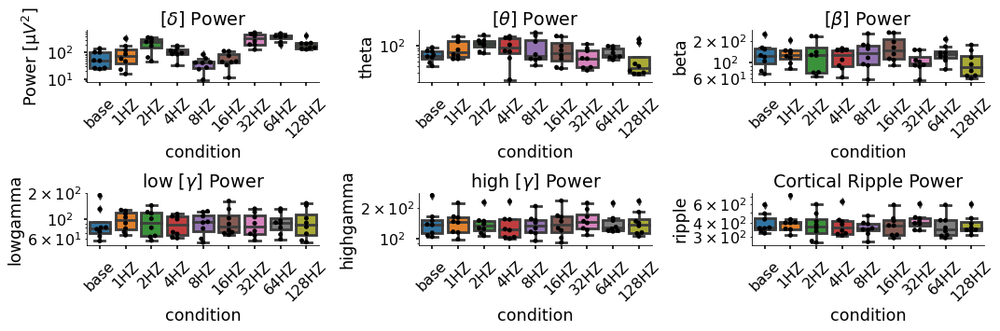

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.read_excel(os.path.join(save_path, file_name ))   
# Frequency bands and titles
bands = ['delta', 'theta', 'beta', 'lowgamma', 'highgamma', 'ripple']
titles = [
    r'[$\delta$] Power', r'[$\theta$] Power', r'[$\beta$] Power',
    r'low [$\gamma$] Power', r'high [$\gamma$] Power', r'Cortical Ripple Power'
]
xticklabels = [
    'base', '1HZ', '2HZ', '4HZ', '8HZ', '16HZ', '32HZ', '64HZ', '128HZ'
]

# Create subplots
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(15,5))

# Loop over each frequency band
for i, band in enumerate(bands):
    row, col = divmod(i, 3)  # Determine row and column for each subplot
    
    # Create boxplot and swarmplot
    sns.boxplot(data=df, x='condition', y=band, ax=ax[row, col])
    sns.swarmplot(data=df, x='condition', y=band, color='k', ax=ax[row, col], dodge=True)
    
    # Set plot properties
    ax[row, col].set_xticklabels(xticklabels)
    ax[row, col].tick_params(axis='x', rotation=45)
    ax[row, col].set_title(titles[i])
    
    # Set y-axis to log scale and remove top/right spines
    ax[row, col].set_yscale("log")
    ax[row, col].spines['top'].set_visible(False)
    ax[row, col].spines['right'].set_visible(False)
    
    # Set y-axis label if needed
    if band == 'delta':
        ax[row, col].set_ylabel('Power [\u03bc$V^2$]')

plt.tight_layout()

# plt.savefig(os.path.join(save_path, name + 'BandPower_L_2_3.pdf'), bbox_inches='tight')


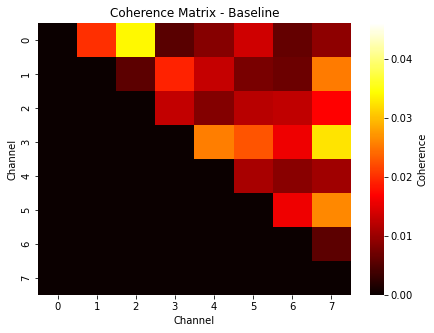

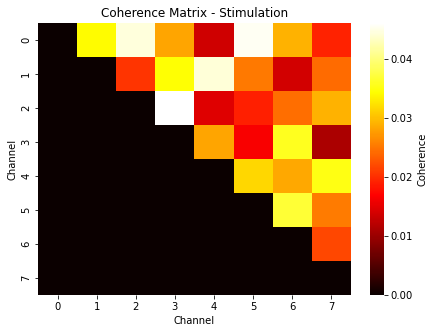

Average Coherence - Baseline: 0.014661407361150732
Average Coherence - Stimulation: 0.027837682029280265


In [10]:
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
# Coherence calculation for data within layer 2/3
def calculate_coherence(data_list, sf, freq_range=None):
    num_channels = len(data_list)
    coherence_matrix = np.zeros((num_channels, num_channels))

    # Loop through all pairs of channels
    for i in range(num_channels):
        for j in range(i + 1, num_channels):
            f, Cxy = signal.coherence(data_list[i], data_list[j], fs=sf, nperseg=1024)
            
            if freq_range:
                # Find indices within the desired frequency range
                freq_indices = np.where((f >= freq_range[0]) & (f <= freq_range[1]))
                coherence_matrix[i, j] = np.mean(Cxy[freq_indices])
            else:
                coherence_matrix[i, j] = np.mean(Cxy)
    
    return coherence_matrix


def plot_coherence_matrix(matrix, title='', vmin=None, vmax=None):
    plt.figure(figsize=(7, 5))
    ax = sns.heatmap(matrix, annot=False, cmap='hot', vmin=vmin, vmax=vmax, cbar_kws={'label': 'Coherence'})
    ax.set_title(title)
    ax.set_xlabel('Channel')
    ax.set_ylabel('Channel')
# Define start and end times for base and stim32 separately
base_intervals = [(1, 5)]
stim32_intervals = [(123, 125)]

# Extract data segments for baseline (clean_data_stim_base) and stim32 (clean_data_stim_32)
clean_data_stim_base = [data[start * fs:end * fs] for data in clean_data_stim for start, end in base_intervals]
clean_data_stim_32 = [data[start * fs:end * fs] for data in clean_data_stim for start, end in stim32_intervals]

# Calculate coherence matrices
coherence_matrix_base_L2_3 = calculate_coherence(clean_data_stim_base, sf=target_sf, freq_range=(30, 80))
coherence_matrix_stim_L2_3 = calculate_coherence(clean_data_stim_32, sf=target_sf, freq_range=(30, 80))

# Find global min and max values for the color scale
min_coherence = min(coherence_matrix_base_L2_3.min(), coherence_matrix_stim_L2_3.min())
max_coherence = max(coherence_matrix_base_L2_3.max(), coherence_matrix_stim_L2_3.max())

# Plot baseline coherence matrix
plot_coherence_matrix(
    coherence_matrix_base_L2_3, 
    title="Coherence Matrix - Baseline",
    vmin=min_coherence, 
    vmax=max_coherence  # Set consistent color scale
)
plt.savefig(os.path.join(save_path_coherence, 'Coherence_Matrix_Baseline_L2_3.svg'), bbox_inches='tight')
plt.show()

# Plot stimulation coherence matrix
plot_coherence_matrix(
    coherence_matrix_stim_L2_3, 
    title="Coherence Matrix - Stimulation",
    vmin=min_coherence, 
    vmax=max_coherence  # Set consistent color scale
)
plt.savefig(os.path.join(save_path_coherence, 'Coherence_Matrix_Stimulation_L2_3.svg'), bbox_inches='tight')
plt.show()

# Calculate average coherence for quantification
coherence_avg_base_L2_3 = np.mean(coherence_matrix_base_L2_3[coherence_matrix_base_L2_3 > 0])
coherence_avg_stim_L2_3 = np.mean(coherence_matrix_stim_L2_3[coherence_matrix_stim_L2_3 > 0])

print("Average Coherence - Baseline:", coherence_avg_base_L2_3)
print("Average Coherence - Stimulation:", coherence_avg_stim_L2_3)



# Create a dictionary for coherence matrices
coherence_dict = {
    "Baseline Coherence Matrix": coherence_matrix_base_L2_3,
    "Stimulation Coherence Matrix": coherence_matrix_stim_L2_3
}

# Create a dictionary for average coherence values
coherence_avgs = {
    "Average Coherence - Baseline": coherence_avg_base_L2_3,
    "Average Coherence - Stimulation": coherence_avg_stim_L2_3
}

# Save coherence matrices to an Excel file
def save_coherence_to_excel(coherence_dict, file_path):
    # Create a writer object
    with pd.ExcelWriter(file_path, engine='openpyxl') as writer:
        for label, matrix in coherence_dict.items():
            # Convert matrix to DataFrame and save to Excel
            df = pd.DataFrame(matrix)
            df.to_excel(writer, sheet_name=label, index=False, header=False)
       
        # Save average coherence values to a separate sheet
        avg_df = pd.DataFrame.from_dict(coherence_avgs, orient='index', columns=['Average Coherence'])
        avg_df.to_excel(writer, sheet_name='Average Coherence')
# Specify the path to save the Excel file
excel_file_path = os.path.join(save_path, name + '_L2_3_coherence_matrices.xlsx')
save_coherence_to_excel(coherence_dict, excel_file_path)

# 128Hz Dynamics

In [10]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import os

layer = 'L_2_3'
# Frequency bands and data groupings
freq_bands = {
    'delta': [1, 4],
    'theta': [4, 10],
    'beta': [10, 25],
    'lowgamma': [30, 60],
    'highgamma': [60, 100],
    'gamma': [30, 100],
    'ripple': [100, 200]
}

data_groups = {
    'stim': clean_data_stim,
    'base': clean_data_base,
}


# Time segments
time_segments = {
    '1s': (123, 124),
    '2s': (124, 125),
    '3s': (125, 126),
    '4s': (126, 127),
    '5s': (127, 128),
    '6s': (128, 129),
    '7s': (129, 130),
    '8s': (130, 131),
    '9s': (131, 132),
    '10s': (132, 133),
    '11s': (133, 134),
    '12s': (134, 135),
    '13s': (135, 136),
    '14s': (136, 137),
    '15s': (137, 138),
    '16s': (138, 139),
    '17s': (139, 140),
    '18s': (140, 141),
    '19s': (141, 142),
    '20s': (142, 143),
    '21s': (143, 144),
    '22s': (144, 145),
    '23s': (145, 146),
    '24s': (146, 147),
    '25s': (147, 148),
    '26s': (148, 149),
    '27s': (149, 150),
    '28s': (150, 151),
    '29s': (151, 152),
    '30s': (152, 153),
}


# Function to compute band power for each time segment
def compute_band_power(data, fs, freq_band, start, end):
    return bandpower(data[start * fs:end * fs], fs, freq_band, 'welch')

# Initialize results dictionary for band power per time segment
band_results = {band: {group: {segment: [] for segment in time_segments} for group in data_groups} for band in freq_bands}

# Main loop for bandpower calculation with time segments
for i in range(len(L_2_3)):
    for band_name, band_range in freq_bands.items():
        for group_name, group_data in data_groups.items():
            for segment_name, (start, end) in time_segments.items():
                # Compute band power for the specific time segment
                bp = compute_band_power(group_data[i], target_sf, band_range, start, end)
                band_results[band_name][group_name][segment_name].append(bp)

# Prepare data for export, now considering time segments
export_data = {}
for band in freq_bands:
    concatenated_data = []
    for group in data_groups:
        for segment in time_segments:
            segment_data = band_results[band][group][segment]
            
            # Ensure the segment data is not empty and contains valid arrays
            if len(segment_data) > 0:
                # Convert any zero-dimensional arrays into one-dimensional ones
                segment_data = [np.atleast_1d(data) for data in segment_data]
                concatenated_data.append(np.concatenate(segment_data))
    
    # Only concatenate if we have non-empty arrays
    if len(concatenated_data) > 0:
        export_data[band] = np.concatenate(concatenated_data)
    else:
        export_data[band] = np.array([])  # Handle case where there's no data

# Create conditions list, including the data groups and time segments
conditions = np.concatenate([
    len(band_results['delta'][group][segment]) * [f"{group}_{segment}"]
    for group in data_groups for segment in time_segments if len(band_results['delta'][group][segment]) > 0
])

# Calculate average band power for each condition
average_cols = {}
for band in freq_bands:
    if len(export_data[band]) > 0:
        # Split data for the band into separate arrays by condition (group + segment)
        data_per_condition = np.array_split(export_data[band], len(data_groups) * len(time_segments))
        avg_per_condition = [np.mean(segment) for segment in data_per_condition]

        # Create a column repeating the average value for alignment with the DataFrame length
        average_col = np.concatenate([[avg] * len(segment) for avg, segment in zip(avg_per_condition, data_per_condition)])
        average_cols[f'Average {band}'] = average_col
    else:
        average_cols[f'Average {band}'] = np.array([])  # Handle empty case

# Metadata (modify or add actual values as needed)
layer_col = [layer] * len(conditions)  # Replace with actual data if available
id_col = [name] * len(conditions)      # Replace with actual data if available
strain_col = [strain] * len(conditions)  # Replace with actual data if available

# Create DataFrame for export, now including time segments
df_export = pd.DataFrame({
    **export_data,
    'condition': conditions,
    **average_cols,
    'Layer': layer_col,
    'ID': id_col,
    'strain': strain_col
})

# Export to Excel
file_name = f"{name}_128Hz_Dynamic_BandPower_{layer}.xlsx"
save_path_full = os.path.join(save_path, file_name)

with pd.ExcelWriter(save_path_full, engine='xlsxwriter') as writer:
    df_export.to_excel(writer, sheet_name='BandPower', index=False)

print("Data exported successfully.")



Data exported successfully.


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import os
import pandas as pd

# Load the exported data from the previous code
df = pd.read_excel(os.path.join(save_path, file_name))

# Frequency bands and titles (only 'gamma' in this case)
bands = ['gamma']
titles = [r'[$\gamma$] Power']

# Updated condition labels based on time segments and groups
xticklabels = [
    '5s', '10s', '15s', '20s', '25s', '30s', '35s', '40s', '45s', '50s', '55s', '60s'
]

# Create a single subplot for the gamma band
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

# Loop over the frequency band and create the plot (just for 'gamma' in this case)
for i, band in enumerate(bands):
    # Create boxplot for each condition and frequency band
    sns.boxplot(data=df, x='condition', y=band, ax=ax, showfliers=False)
    
    # Create swarmplot (or stripplot) to show individual points on top of the boxplot
    sns.stripplot(data=df, x='condition', y=band, color='k', ax=ax, dodge=True)
    
    # Set the x-axis labels to the updated condition names
    ax.set_xticklabels(xticklabels)
    ax.tick_params(axis='x', rotation=90, labelsize=10)  # Rotate x-axis labels for readability
    
    # Set title for the plot based on the band
    ax.set_title(titles[i])
    
    # Set y-axis to log scale for better visualization of power values
    ax.set_yscale("log")
    
    # Remove top and right spines to make the plot look cleaner
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Set y-axis label
    ax.set_ylabel('Power [\u03bc$V^2$]')

# Adjust the layout for better spacing
plt.tight_layout()



# Save the figure as a PDF
plt.savefig(os.path.join(save_path, name + '128Hz_Dynamics_BandPower_L2_3.pdf'), bbox_inches='tight')

# Show the plot
plt.show()


In [27]:
# Initialize lists to store downsampled data segments
data_base = []
data_stim128 = []

time_segments = {
    'base': (125, 290),
    'stim128': (125, 290)
}
# Define the start and end times for each condition
conditions = {
    'data_base': (time_segments['base'][0] * fs, time_segments['base'][1] * fs),
    'data_stim128': (time_segments['stim128'][0] * fs, time_segments['stim128'][1] * fs)
}

# Target sampling frequency for downsampling
target_sf = 1000  # Adjust to your desired target sampling rate

# Loop through the data and conditions to populate the individual lists with downsampled data
for i in range(len(clean_data_stim)):
    data_base.append(downsample_data(clean_data_base[i][conditions['data_base'][0]:conditions['data_base'][1]], sf, target_sf)[0])
    data_stim128.append(downsample_data(clean_data_stim[i][conditions['data_stim128'][0]:conditions['data_stim128'][1]], sf, target_sf)[0])

# Now you have separate lists for each condition with downsampled data

In [29]:
sf = target_sf
p_obj = Pac(idpac=(4, 0, 0), f_pha=(1, 30, 1, .2), f_amp=(1, 200, 1, 2)) # 1-30 DTAB

pha = p_obj.filter(target_sf, np.array(data_base), ftype='phase', n_jobs=-1)
amp = p_obj.filter(target_sf, np.array(data_base), ftype='amplitude', n_jobs=-1)
pac_base = p_obj.fit(pha, amp)

pha = p_obj.filter(target_sf, np.array(data_stim128), ftype='phase', n_jobs=-1)
amp = p_obj.filter(target_sf, np.array(data_stim128), ftype='amplitude', n_jobs=-1)
pac_stim128 = p_obj.fit(pha, amp)







# ################# saving ndarrays
import numpy as np
from pathlib import Path

path = Path(save_path).expanduser()
path.mkdir(parents=True, exist_ok=True)

np.save(path/(name + layer + '_pac_base'), pac_base)
np.save(path/(name + layer + 'pac_stim128'), pac_stim128)




Phase Amplitude Coupling object defined
    true PAC estimation using Normalized Direct Pac (ndPac, Ozkurt et al. 2012)
    true PAC estimation using Normalized Direct Pac (ndPac, Ozkurt et al. 2012)


Shape of pacc for base: (99, 140)
Shape of pacc for 128HZ: (99, 140)


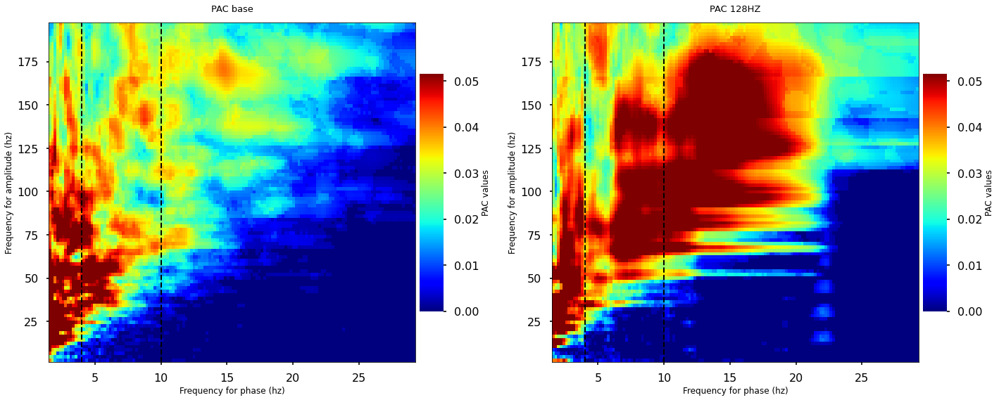

In [34]:
import matplotlib.pyplot as plt
import numpy as np

condition = ['base', 
             '128HZ'
            ]

pac = [pac_base, 
       pac_stim128
      ]

# Set up the figure size for the plot
plt.figure(figsize=(20, 8))

# Initialize variable to store the global vmax
global_vmax = -np.inf  # Start with a very low value

# First loop to determine global vmax
for k in pac:
    pacc = k.mean(axis=1)  # Compute the mean across time points/trials
    global_vmax = max(global_vmax, pacc.max())  # Update global vmax with the max value across all conditions

# Loop through each condition and its corresponding PAC
for i, (k, cond) in enumerate(zip(pac, condition)):
    pacc = k.mean(axis=-1)
    
    # Check the shape of pacc after mean calculation
    print(f"Shape of pacc for {cond}: {pacc.shape}")
    
    # Set up the color scaling using the global vmax
    kw = dict(vmax=global_vmax, vmin=0, cmap='jet')
    
    # Plotting the comodulogram
    plt.subplot(1, 2, i + 1)
    p_obj.comodulogram(pacc, title=f"PAC {cond}", **kw)
    
    # Adding vertical lines at specific points for reference
    plt.axvline(x=4, color='k', linestyle='--', linewidth=2.0)
    plt.axvline(x=10, color='k', linestyle='--', linewidth=2.0)

# Adjust layout for better spacing
plt.tight_layout()

####### Saving
import os.path
fileName = name2
plt.savefig(os.path.join(save_path , fileName + layer + '_PAC.svg'),bbox_inches = 'tight')
plt.savefig(os.path.join(save_path , fileName + layer + '_PAC.pdf'), bbox_inches = 'tight')

In [35]:
pp_obj  = PreferredPhase(f_pha=[4,8], f_amp=(30, 200, 2, 2)) # THETA (4-8 Hz)
n_jobs = -1
# compute the preferred phase (reuse the amplitude computed above)
pha_b = pp_obj.filter(target_sf, np.array(data_base), ftype='phase', n_jobs=n_jobs)
amp_b = pp_obj.filter(target_sf, np.array(data_base), ftype='amplitude', n_jobs=n_jobs)
pha_128 = pp_obj.filter(target_sf, np.array(data_stim128), ftype='phase', n_jobs=n_jobs)
amp_128 = pp_obj.filter(target_sf, np.array(data_stim128), ftype='amplitude', n_jobs=n_jobs)


n_bins= 72
ampbin_base, _, vecbin = pp_obj.fit(pha_b, amp_b, n_bins=n_bins)
ampbin_128, _, vecbin = pp_obj.fit(pha_128, amp_128, n_bins=n_bins)


# mean binned amplitude across trials
ampbin_base = np.squeeze(ampbin_base).mean(-1).T
ampbin_128 = np.squeeze(ampbin_128).mean(-1).T




################# saving ndarrays theta
import numpy as np
from pathlib import Path

path.mkdir(parents=True, exist_ok=True)

np.save(path/(name2 + layer + '_ampbin_base'), ampbin_base)
np.save(path/(name2 + layer + '_ampbin_128'), ampbin_128)



Preferred phase object defined


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# List of all the amplitude bins (all frequency conditions)
ampbins = [ampbin_base, ampbin_128]

# Find the global minimum and maximum values across all amplitude bins
global_min = np.min([np.min(amp) for amp in ampbins])
global_max = np.max([np.max(amp) for amp in ampbins])

# Now set vmin and vmax to these global values
vmin_value = global_min
vmax_value = global_max

# Define the plotting dictionary with consistent color range
kw_plt = dict(cmap='RdBu_r', interp=0.1, cblabel='Bins Amplitude', 
              colorbar=True, y=1.3, fz_title=20, plotas='contour', 
              vmin=vmin_value, vmax=vmax_value)

# Create the figure
plt.figure(figsize=(28, 23))

# Plot the data for each frequency condition using the updated kw_plt dictionary
pp_obj.polar(ampbin_base, vecbin, pp_obj.yvec, subplot=331, title='Baseline', **kw_plt)
pp_obj.polar(ampbin_128, vecbin, pp_obj.yvec, subplot=332, title='128HZ', **kw_plt)

# Adjust layout to prevent overlapping elements
plt.tight_layout()

########### Saving
import os.path
fileName = name2
plt.savefig(os.path.join(save_path , fileName + layer + '_PreferredPhase_ThetaGamma.pdf'), bbox_inches = 'tight')

# Layer 5

In [10]:
##########################################################
##########################################################
########################################################## L 5
from scipy import signal
from scipy.signal import butter, lfilter
sf = 20000 # sampling frequency
target_sf = 10000 # target frequency for downsampling
f0 = 60.0  # Frequency to be removed from signal (Hz)
w0 = f0/(target_sf/2)  # Normalized Frequency
Q = 30 # Quality factor
# Design notch filter
b, a = signal.iirnotch(w0, Q)

start = 0

################################################### baseline
end = int(len(ChannelData_baseline[0])/sf)
clean_data_base = []

for chanlNo in (L_5):
    data = ChannelData_baseline[chanlNo].ravel()
    spike_data = filter_data(data[start*sf:end*sf], low=1, high= 500, sf=sf) # Band pass filter the data for LFP analysis
    # Now we use the above function to downsample the signal.
    lfp_data, sf_lfp = downsample_data(spike_data, sf=sf, target_sf=target_sf)
    clean_data_base.append(signal.lfilter(b, a, lfp_data))

################################################### stimulation
end = int(len(ChannelData_stim[0])/sf)
clean_data_stim = []

for chanlNo in (L_5):
    data = ChannelData_stim[chanlNo].ravel()
    spike_data = filter_data(data[start*sf:end*sf], low=1, high= 500, sf=sf) # Band pass filter the data for LFP analysis
    # Now we use the above function to downsample the signal.
    lfp_data, sf_lfp = downsample_data(spike_data, sf=sf, target_sf=target_sf)
    clean_data_stim.append(signal.lfilter(b, a, lfp_data))

    

In [11]:
import warnings
import numpy as np
import pandas as pd
import os
from scipy import signal

warnings.filterwarnings('ignore')

layer = 'L_5'
# Frequency bands
freq_bands = {
    'delta': [1, 4],
    'theta': [4, 10],
    'beta': [10, 25],
    'lowgamma': [30, 60],
    'highgamma': [60, 100],
    'gamma': [30, 100],
    'ripple': [100, 200]
}

# Time segments
time_segments = {
    'base': (1, 2),
    'stim1': (9, 10),
    'stim2': (25, 26),
    'stim4': (41, 42),
    'stim8': (58, 59),
    'stim16': (74, 75),
    'stim32': (90, 91),
    'stim64': (106, 107),
    'stim128': (123, 124)
}

# Function to compute band power for each time segment
def compute_band_power(data, fs, freq_band, start, end):
    return bandpower(data[start * fs:end * fs], fs, freq_band, 'welch')

# Main processing loop to calculate band power
results = {band: {segment: [] for segment in time_segments} for band in freq_bands}

for i in range(len(L_5)):
    for band_name, band_range in freq_bands.items():
        for segment_name, (start, end) in time_segments.items():
            bp = compute_band_power(clean_data_stim[i], fs, band_range, start, end)
            results[band_name][segment_name].append(bp)

# Preparing data for export by concatenating results
export_data = {band: np.concatenate([results[band][seg] for seg in time_segments]) for band in freq_bands}

# Prepare metadata columns
num_entries = 9 * len(L_5)  # Adjust as needed based on your data length
layer_col = ['Layer5'] * num_entries
id_col = [name] * num_entries
strain_col = [strain] * num_entries
condition_col = np.concatenate([
    len(results['delta']['base']) * ['base'],
    len(results['delta']['stim1']) * ['1HZ'],
    len(results['delta']['stim2']) * ['2HZ'],
    len(results['delta']['stim4']) * ['4HZ'],
    len(results['delta']['stim8']) * ['8HZ'],
    len(results['delta']['stim16']) * ['16HZ'],
    len(results['delta']['stim32']) * ['32HZ'],
    len(results['delta']['stim64']) * ['64HZ'],
    len(results['delta']['stim128']) * ['128HZ']
])

# Calculate average band power for each condition
average_cols = {}
for band in freq_bands:
    # Split data for the band into separate arrays by condition
    data_per_condition = np.split(export_data[band], len(time_segments))
    avg_per_condition = [np.mean(segment) for segment in data_per_condition]
    
    # Create a column repeating the average value for alignment with the DataFrame length
    average_col = np.concatenate([[avg] * len(segment) for avg, segment in zip(avg_per_condition, data_per_condition)])
    average_cols[f'Average {band}'] = average_col

# Exporting data to Excel
file_name = f"{name}_BandPower_{layer}.xlsx"
save_path_new = os.path.join(save_path, file_name)

with pd.ExcelWriter(save_path_new, engine='xlsxwriter') as writer:
    # Create a DataFrame for each frequency band and write to Excel
    start_col = 0
    for band, data in export_data.items():
        pd.DataFrame({band: data}).to_excel(writer, sheet_name='BandPower', startcol=start_col, index=False)
        start_col += 1
    
    # Write average columns to Excel
    for avg_col_name, avg_data in average_cols.items():
        pd.DataFrame({avg_col_name: avg_data}).to_excel(writer, sheet_name='BandPower', startcol=start_col, index=False)
        start_col += 1
    
    # Write metadata columns to Excel
    pd.DataFrame({'Layer': layer_col}).to_excel(writer, sheet_name='BandPower', startcol=start_col, index=False)
    pd.DataFrame({'ID': id_col}).to_excel(writer, sheet_name='BandPower', startcol=start_col + 1, index=False)
    pd.DataFrame({'Strain': strain_col}).to_excel(writer, sheet_name='BandPower', startcol=start_col + 2, index=False)
    pd.DataFrame({'condition': condition_col}).to_excel(writer, sheet_name='BandPower', startcol=start_col + 3, index=False)

# The context manager automatically closes the writer (no need for writer.save())

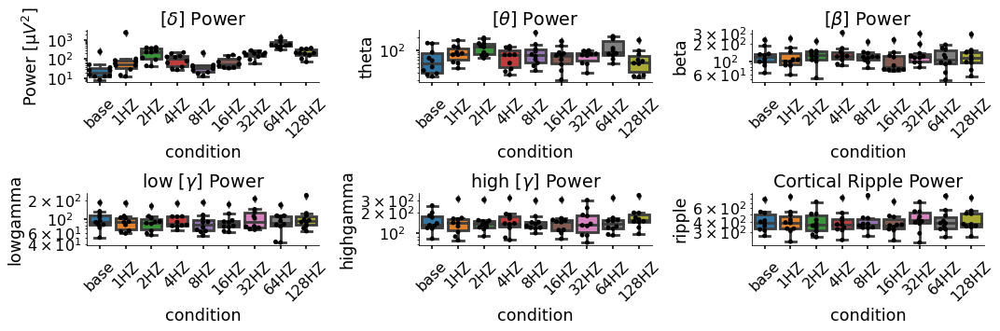

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.read_excel(os.path.join(save_path, file_name ))  
# Frequency bands and titles
bands = ['delta', 'theta', 'beta', 'lowgamma', 'highgamma', 'ripple']
titles = [
    r'[$\delta$] Power', r'[$\theta$] Power', r'[$\beta$] Power',
    r'low [$\gamma$] Power', r'high [$\gamma$] Power', r'Cortical Ripple Power'
]
xticklabels = [
    'base', '1HZ', '2HZ', '4HZ', '8HZ', '16HZ', '32HZ', '64HZ', '128HZ'
]

# Create subplots
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(15,5))

# Loop over each frequency band
for i, band in enumerate(bands):
    row, col = divmod(i, 3)  # Determine row and column for each subplot
    
    # Create boxplot and swarmplot
    sns.boxplot(data=df, x='condition', y=band, ax=ax[row, col])
    sns.swarmplot(data=df, x='condition', y=band, color='k', ax=ax[row, col], dodge=True)
    
    # Set plot properties
    ax[row, col].set_xticklabels(xticklabels)
    ax[row, col].tick_params(axis='x', rotation=45)
    ax[row, col].set_title(titles[i])
    
    # Set y-axis to log scale and remove top/right spines
    ax[row, col].set_yscale("log")
    ax[row, col].spines['top'].set_visible(False)
    ax[row, col].spines['right'].set_visible(False)
    
    # Set y-axis label if needed
    if band == 'delta':
        ax[row, col].set_ylabel('Power [\u03bc$V^2$]')

plt.tight_layout()
# plt.savefig(os.path.join(save_path, name + 'BandPower_L_5.pdf'), bbox_inches='tight')



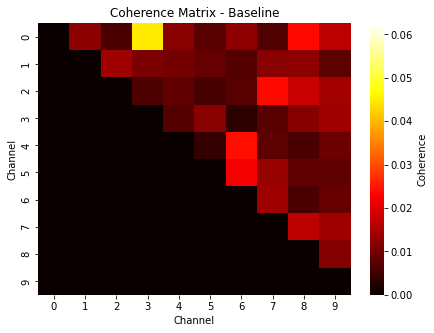

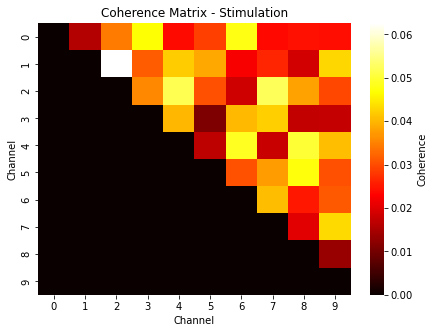

Average Coherence - Baseline: 0.011862329114248856
Average Coherence - Stimulation: 0.03270698229166997


In [14]:
# Extract data segments for baseline (clean_data_stim_base) and stim32 (clean_data_stim_32)
clean_data_stim_base = [data[start * fs:end * fs] for data in clean_data_stim for start, end in base_intervals]
clean_data_stim_32 = [data[start * fs:end * fs] for data in clean_data_stim for start, end in stim32_intervals]

# Calculate coherence matrices
coherence_matrix_base_L5 = calculate_coherence(clean_data_stim_base, sf=target_sf, freq_range=(30, 80))
coherence_matrix_stim_L5 = calculate_coherence(clean_data_stim_32, sf=target_sf, freq_range=(30, 80))

# Find global min and max values for the color scale
min_coherence = min(coherence_matrix_base_L5.min(), coherence_matrix_stim_L5.min())
max_coherence = max(coherence_matrix_base_L5.max(), coherence_matrix_stim_L5.max())

# Plot baseline coherence matrix
plot_coherence_matrix(
    coherence_matrix_base_L5, 
    title="Coherence Matrix - Baseline",
    vmin=min_coherence, 
    vmax=max_coherence  # Set consistent color scale
)
plt.savefig(os.path.join(save_path_coherence, 'Coherence_Matrix_Baseline_L5.svg'), bbox_inches='tight')
plt.show()

# Plot stimulation coherence matrix
plot_coherence_matrix(
    coherence_matrix_stim_L5, 
    title="Coherence Matrix - Stimulation",
    vmin=min_coherence, 
    vmax=max_coherence  # Set consistent color scale
)
plt.savefig(os.path.join(save_path_coherence, 'Coherence_Matrix_Stimulation_L5.svg'), bbox_inches='tight')
plt.show()

# Calculate average coherence for quantification
coherence_avg_base_L5 = np.mean(coherence_matrix_base_L5[coherence_matrix_base_L5 > 0])
coherence_avg_stim_L5 = np.mean(coherence_matrix_stim_L5[coherence_matrix_stim_L5 > 0])

print("Average Coherence - Baseline:", coherence_avg_base_L5)
print("Average Coherence - Stimulation:", coherence_avg_stim_L5)


# Create a dictionary for coherence matrices
coherence_dict = {
    "Baseline Coherence Matrix": coherence_matrix_base_L5,
    "Stimulation Coherence Matrix": coherence_matrix_stim_L5
}

# Create a dictionary for average coherence values
coherence_avgs = {
    "Average Coherence - Baseline": coherence_avg_base_L5,
    "Average Coherence - Stimulation": coherence_avg_stim_L5
}

# Save coherence matrices to an Excel file
def save_coherence_to_excel(coherence_dict, file_path):
    # Create a writer object
    with pd.ExcelWriter(file_path, engine='openpyxl') as writer:
        for label, matrix in coherence_dict.items():
            # Convert matrix to DataFrame and save to Excel
            df = pd.DataFrame(matrix)
            df.to_excel(writer, sheet_name=label, index=False, header=False)
       
        # Save average coherence values to a separate sheet
        avg_df = pd.DataFrame.from_dict(coherence_avgs, orient='index', columns=['Average Coherence'])
        avg_df.to_excel(writer, sheet_name='Average Coherence')
# Specify the path to save the Excel file
excel_file_path = os.path.join(save_path, name + '_L5_coherence_matrices.xlsx')
save_coherence_to_excel(coherence_dict, excel_file_path)

In [15]:
coherence_data = {
    'Layer': ['L2/3', 'L2/3', 'L5', 'L5', ],
    'Condition': ['Base', 'Stim', 'Base', 'Stim'],
    'Coherence Average': [
        coherence_avg_base_L2_3, coherence_avg_stim_L2_3,
        coherence_avg_base_L5, coherence_avg_stim_L5,
    ]
}

# Create a DataFrame
coherence_df = pd.DataFrame(coherence_data)

# Exporting the DataFrame to an Excel file
fileName = name + '_Coherence_Averages'
save_path_full = os.path.join(save_path, fileName + '.xlsx')
with pd.ExcelWriter(save_path_full) as writer:
    coherence_df.to_excel(writer, sheet_name='CoherenceData', index=False)



# 128Hz Dynamics

In [13]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import os

layer = 'L_5'
# Frequency bands and data groupings
freq_bands = {
    'delta': [1, 4],
    'theta': [4, 10],
    'beta': [10, 25],
    'lowgamma': [30, 60],
    'highgamma': [60, 100],
    'gamma': [30, 100],
    'ripple': [100, 200]
}

data_groups = {
    'stim': clean_data_stim,
    'base': clean_data_base,
}


# Time segments
time_segments = {
    '1s': (123, 124),
    '2s': (124, 125),
    '3s': (125, 126),
    '4s': (126, 127),
    '5s': (127, 128),
    '6s': (128, 129),
    '7s': (129, 130),
    '8s': (130, 131),
    '9s': (131, 132),
    '10s': (132, 133),
    '11s': (133, 134),
    '12s': (134, 135),
    '13s': (135, 136),
    '14s': (136, 137),
    '15s': (137, 138),
    '16s': (138, 139),
    '17s': (139, 140),
    '18s': (140, 141),
    '19s': (141, 142),
    '20s': (142, 143),
    '21s': (143, 144),
    '22s': (144, 145),
    '23s': (145, 146),
    '24s': (146, 147),
    '25s': (147, 148),
    '26s': (148, 149),
    '27s': (149, 150),
    '28s': (150, 151),
    '29s': (151, 152),
    '30s': (152, 153),
}


# Function to compute band power for each time segment
def compute_band_power(data, fs, freq_band, start, end):
    return bandpower(data[start * fs:end * fs], fs, freq_band, 'welch')

# Initialize results dictionary for band power per time segment
band_results = {band: {group: {segment: [] for segment in time_segments} for group in data_groups} for band in freq_bands}

# Main loop for bandpower calculation with time segments
for i in range(len(L_5)):
    for band_name, band_range in freq_bands.items():
        for group_name, group_data in data_groups.items():
            for segment_name, (start, end) in time_segments.items():
                # Compute band power for the specific time segment
                bp = compute_band_power(group_data[i], target_sf, band_range, start, end)
                band_results[band_name][group_name][segment_name].append(bp)

# Prepare data for export, now considering time segments
export_data = {}
for band in freq_bands:
    concatenated_data = []
    for group in data_groups:
        for segment in time_segments:
            segment_data = band_results[band][group][segment]
            
            # Ensure the segment data is not empty and contains valid arrays
            if len(segment_data) > 0:
                # Convert any zero-dimensional arrays into one-dimensional ones
                segment_data = [np.atleast_1d(data) for data in segment_data]
                concatenated_data.append(np.concatenate(segment_data))
    
    # Only concatenate if we have non-empty arrays
    if len(concatenated_data) > 0:
        export_data[band] = np.concatenate(concatenated_data)
    else:
        export_data[band] = np.array([])  # Handle case where there's no data

# Create conditions list, including the data groups and time segments
conditions = np.concatenate([
    len(band_results['delta'][group][segment]) * [f"{group}_{segment}"]
    for group in data_groups for segment in time_segments if len(band_results['delta'][group][segment]) > 0
])

# Calculate average band power for each condition
average_cols = {}
for band in freq_bands:
    if len(export_data[band]) > 0:
        # Split data for the band into separate arrays by condition (group + segment)
        data_per_condition = np.array_split(export_data[band], len(data_groups) * len(time_segments))
        avg_per_condition = [np.mean(segment) for segment in data_per_condition]

        # Create a column repeating the average value for alignment with the DataFrame length
        average_col = np.concatenate([[avg] * len(segment) for avg, segment in zip(avg_per_condition, data_per_condition)])
        average_cols[f'Average {band}'] = average_col
    else:
        average_cols[f'Average {band}'] = np.array([])  # Handle empty case

# Metadata (modify or add actual values as needed)
layer_col = [layer] * len(conditions)  # Replace with actual data if available
id_col = [name] * len(conditions)      # Replace with actual data if available
strain_col = [strain] * len(conditions)  # Replace with actual data if available

# Create DataFrame for export, now including time segments
df_export = pd.DataFrame({
    **export_data,
    'condition': conditions,
    **average_cols,
    'Layer': layer_col,
    'ID': id_col,
    'strain': strain_col
})

# Export to Excel
file_name = f"{name}_128Hz_Dynamic_BandPower_{layer}.xlsx"
save_path_full = os.path.join(save_path, file_name)

with pd.ExcelWriter(save_path_full, engine='xlsxwriter') as writer:
    df_export.to_excel(writer, sheet_name='BandPower', index=False)

print("Data exported successfully.")



Data exported successfully.


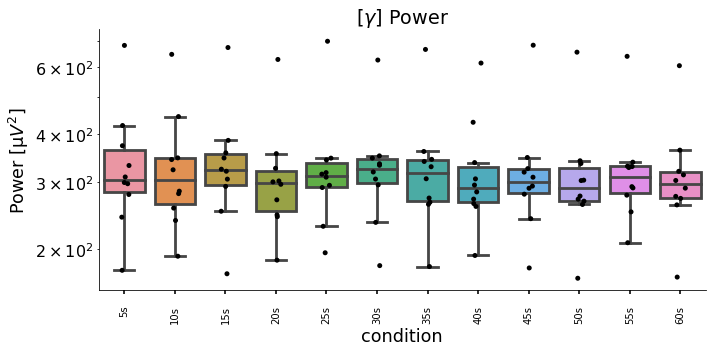

In [47]:
import seaborn as sns
import matplotlib.pyplot as plt
import os
import pandas as pd

# Load the exported data from the previous code
df = pd.read_excel(os.path.join(save_path, file_name))

# Frequency bands and titles (only 'gamma' in this case)
bands = ['gamma']
titles = [r'[$\gamma$] Power']

# Updated condition labels based on time segments and groups
xticklabels = [
    '5s', '10s', '15s', '20s', '25s', '30s', '35s', '40s', '45s', '50s', '55s', '60s'
]

# Create a single subplot for the gamma band
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

# Loop over the frequency band and create the plot (just for 'gamma' in this case)
for i, band in enumerate(bands):
    # Create boxplot for each condition and frequency band
    sns.boxplot(data=df, x='condition', y=band, ax=ax, showfliers=False)
    
    # Create swarmplot (or stripplot) to show individual points on top of the boxplot
    sns.stripplot(data=df, x='condition', y=band, color='k', ax=ax, dodge=True)
    
    # Set the x-axis labels to the updated condition names
    ax.set_xticklabels(xticklabels)
    ax.tick_params(axis='x', rotation=90, labelsize=10)  # Rotate x-axis labels for readability
    
    # Set title for the plot based on the band
    ax.set_title(titles[i])
    
    # Set y-axis to log scale for better visualization of power values
    ax.set_yscale("log")
    
    # Remove top and right spines to make the plot look cleaner
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Set y-axis label
    ax.set_ylabel('Power [\u03bc$V^2$]')

# Adjust the layout for better spacing
plt.tight_layout()



# Save the figure as a PDF
plt.savefig(os.path.join(save_path, name + '128Hz_Dynamics_BandPower_L5.pdf'), bbox_inches='tight')

# Show the plot
plt.show()

In [48]:
# Initialize lists to store downsampled data segments
data_base = []
data_stim128 = []

time_segments = {
    'base': (125, 290),
    'stim128': (125, 290)
}
# Define the start and end times for each condition
conditions = {
    'data_base': (time_segments['base'][0] * fs, time_segments['base'][1] * fs),
    'data_stim128': (time_segments['stim128'][0] * fs, time_segments['stim128'][1] * fs)
}

# Target sampling frequency for downsampling
target_sf = 1000  # Adjust to your desired target sampling rate

# Loop through the data and conditions to populate the individual lists with downsampled data
for i in range(len(clean_data_stim)):
    data_base.append(downsample_data(clean_data_base[i][conditions['data_base'][0]:conditions['data_base'][1]], sf, target_sf)[0])
    data_stim128.append(downsample_data(clean_data_stim[i][conditions['data_stim128'][0]:conditions['data_stim128'][1]], sf, target_sf)[0])

# Now you have separate lists for each condition with downsampled data

In [49]:
sf = target_sf
p_obj = Pac(idpac=(4, 0, 0), f_pha=(1, 30, 1, .2), f_amp=(1, 200, 1, 2)) # 1-30 DTAB

pha = p_obj.filter(target_sf, np.array(data_base), ftype='phase', n_jobs=-1)
amp = p_obj.filter(target_sf, np.array(data_base), ftype='amplitude', n_jobs=-1)
pac_base = p_obj.fit(pha, amp)

pha = p_obj.filter(target_sf, np.array(data_stim128), ftype='phase', n_jobs=-1)
amp = p_obj.filter(target_sf, np.array(data_stim128), ftype='amplitude', n_jobs=-1)
pac_stim128 = p_obj.fit(pha, amp)







# ################# saving ndarrays
import numpy as np
from pathlib import Path

path = Path(save_path).expanduser()
path.mkdir(parents=True, exist_ok=True)

np.save(path/(name + layer + '_pac_base'), pac_base)
np.save(path/(name + layer + 'pac_stim128'), pac_stim128)




Phase Amplitude Coupling object defined
    true PAC estimation using Normalized Direct Pac (ndPac, Ozkurt et al. 2012)
    true PAC estimation using Normalized Direct Pac (ndPac, Ozkurt et al. 2012)


Shape of pacc for base: (99, 140)
Shape of pacc for 128HZ: (99, 140)


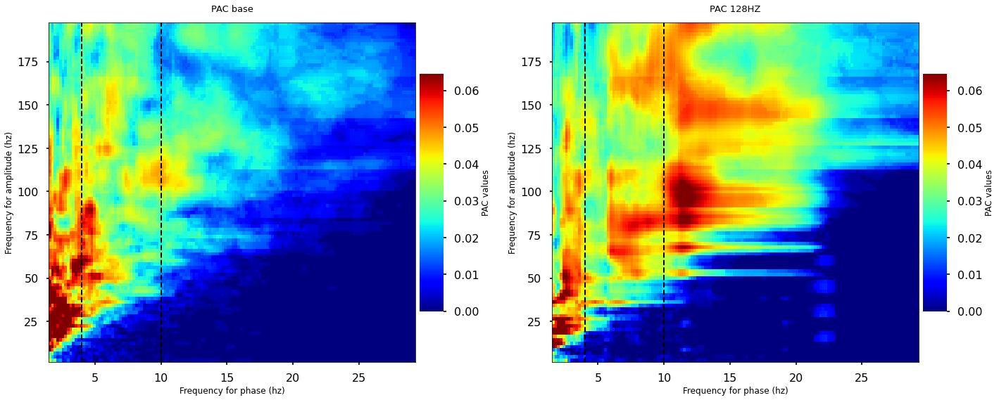

In [50]:
import matplotlib.pyplot as plt
import numpy as np

condition = ['base', 
             '128HZ'
            ]

pac = [pac_base, 
       pac_stim128
      ]

# Set up the figure size for the plot
plt.figure(figsize=(20, 8))

# Initialize variable to store the global vmax
global_vmax = -np.inf  # Start with a very low value

# First loop to determine global vmax
for k in pac:
    pacc = k.mean(axis=1)  # Compute the mean across time points/trials
    global_vmax = max(global_vmax, pacc.max())  # Update global vmax with the max value across all conditions

# Loop through each condition and its corresponding PAC
for i, (k, cond) in enumerate(zip(pac, condition)):
    pacc = k.mean(axis=-1)
    
    # Check the shape of pacc after mean calculation
    print(f"Shape of pacc for {cond}: {pacc.shape}")
    
    # Set up the color scaling using the global vmax
    kw = dict(vmax=global_vmax, vmin=0, cmap='jet')
    
    # Plotting the comodulogram
    plt.subplot(1, 2, i + 1)
    p_obj.comodulogram(pacc, title=f"PAC {cond}", **kw)
    
    # Adding vertical lines at specific points for reference
    plt.axvline(x=4, color='k', linestyle='--', linewidth=2.0)
    plt.axvline(x=10, color='k', linestyle='--', linewidth=2.0)

# Adjust layout for better spacing
plt.tight_layout()

####### Saving
import os.path
fileName = name2
plt.savefig(os.path.join(save_path , fileName + layer + '_PAC.svg'),bbox_inches = 'tight')
plt.savefig(os.path.join(save_path , fileName + layer + '_PAC.pdf'), bbox_inches = 'tight')

In [51]:
pp_obj  = PreferredPhase(f_pha=[4,8], f_amp=(30, 200, 2, 2)) # THETA (4-8 Hz)
n_jobs = -1
# compute the preferred phase (reuse the amplitude computed above)
pha_b = pp_obj.filter(target_sf, np.array(data_base), ftype='phase', n_jobs=n_jobs)
amp_b = pp_obj.filter(target_sf, np.array(data_base), ftype='amplitude', n_jobs=n_jobs)
pha_128 = pp_obj.filter(target_sf, np.array(data_stim128), ftype='phase', n_jobs=n_jobs)
amp_128 = pp_obj.filter(target_sf, np.array(data_stim128), ftype='amplitude', n_jobs=n_jobs)


n_bins= 72
ampbin_base, _, vecbin = pp_obj.fit(pha_b, amp_b, n_bins=n_bins)
ampbin_128, _, vecbin = pp_obj.fit(pha_128, amp_128, n_bins=n_bins)


# mean binned amplitude across trials
ampbin_base = np.squeeze(ampbin_base).mean(-1).T
ampbin_128 = np.squeeze(ampbin_128).mean(-1).T




################# saving ndarrays theta
import numpy as np
from pathlib import Path

path.mkdir(parents=True, exist_ok=True)

np.save(path/(name2 + layer + '_ampbin_base'), ampbin_base)
np.save(path/(name2 + layer + '_ampbin_128'), ampbin_128)



Preferred phase object defined


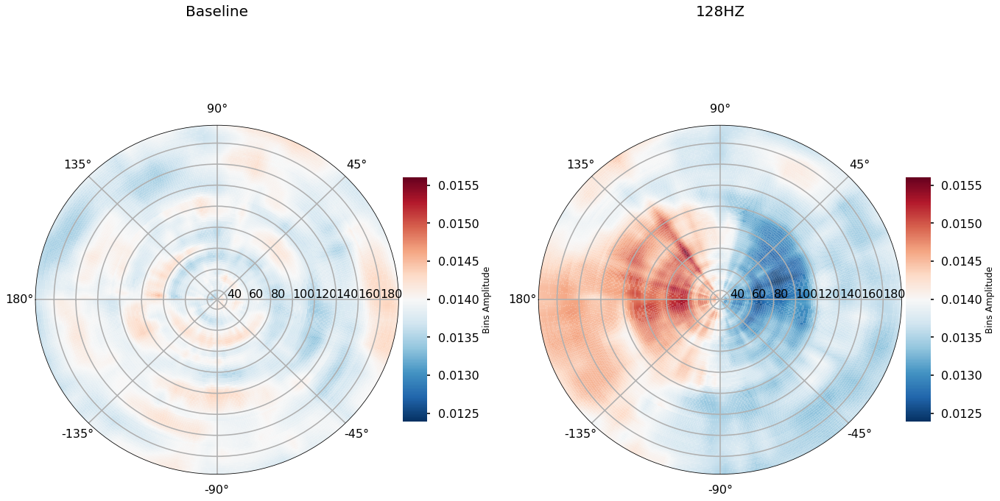

In [52]:
import numpy as np
import matplotlib.pyplot as plt

# List of all the amplitude bins (all frequency conditions)
ampbins = [ampbin_base, ampbin_128]

# Find the global minimum and maximum values across all amplitude bins
global_min = np.min([np.min(amp) for amp in ampbins])
global_max = np.max([np.max(amp) for amp in ampbins])

# Now set vmin and vmax to these global values
vmin_value = global_min
vmax_value = global_max

# Define the plotting dictionary with consistent color range
kw_plt = dict(cmap='RdBu_r', interp=0.1, cblabel='Bins Amplitude', 
              colorbar=True, y=1.3, fz_title=20, plotas='contour', 
              vmin=vmin_value, vmax=vmax_value)

# Create the figure
plt.figure(figsize=(28, 23))

# Plot the data for each frequency condition using the updated kw_plt dictionary
pp_obj.polar(ampbin_base, vecbin, pp_obj.yvec, subplot=331, title='Baseline', **kw_plt)
pp_obj.polar(ampbin_128, vecbin, pp_obj.yvec, subplot=332, title='128HZ', **kw_plt)

# Adjust layout to prevent overlapping elements
plt.tight_layout()

########### Saving
import os.path
fileName = name2
plt.savefig(os.path.join(save_path , fileName + layer + '_PreferredPhase_ThetaGamma.pdf'), bbox_inches = 'tight')